In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
#importing dataset
from data import get_heart_dataset

In [3]:
data = get_heart_dataset()

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       303 non-null    int64  
 1   sex       303 non-null    int64  
 2   cp        303 non-null    int64  
 3   trestbps  303 non-null    int64  
 4   chol      303 non-null    int64  
 5   fbs       303 non-null    int64  
 6   restecg   303 non-null    int64  
 7   thalach   303 non-null    int64  
 8   exang     303 non-null    int64  
 9   oldpeak   303 non-null    float64
 10  slope     303 non-null    int64  
 11  ca        303 non-null    int64  
 12  thal      303 non-null    int64  
 13  target    303 non-null    int64  
dtypes: float64(1), int64(13)
memory usage: 33.3 KB


In [5]:
data.isnull().sum()

age         0
sex         0
cp          0
trestbps    0
chol        0
fbs         0
restecg     0
thalach     0
exang       0
oldpeak     0
slope       0
ca          0
thal        0
target      0
dtype: int64

In [6]:
from data_analytics import dataset_analytics
correlation = dataset_analytics(data)

              age         sex          cp    trestbps        chol         fbs  \
count  303.000000  303.000000  303.000000  303.000000  303.000000  303.000000   
mean    54.366337    0.683168    0.966997  131.623762  246.264026    0.148515   
std      9.082101    0.466011    1.032052   17.538143   51.830751    0.356198   
min     29.000000    0.000000    0.000000   94.000000  126.000000    0.000000   
25%     47.500000    0.000000    0.000000  120.000000  211.000000    0.000000   
50%     55.000000    1.000000    1.000000  130.000000  240.000000    0.000000   
75%     61.000000    1.000000    2.000000  140.000000  274.500000    0.000000   
max     77.000000    1.000000    3.000000  200.000000  564.000000    1.000000   

          restecg     thalach       exang     oldpeak       slope          ca  \
count  303.000000  303.000000  303.000000  303.000000  303.000000  303.000000   
mean     0.528053  149.646865    0.326733    1.039604    1.399340    0.729373   
std      0.525860   22.9051

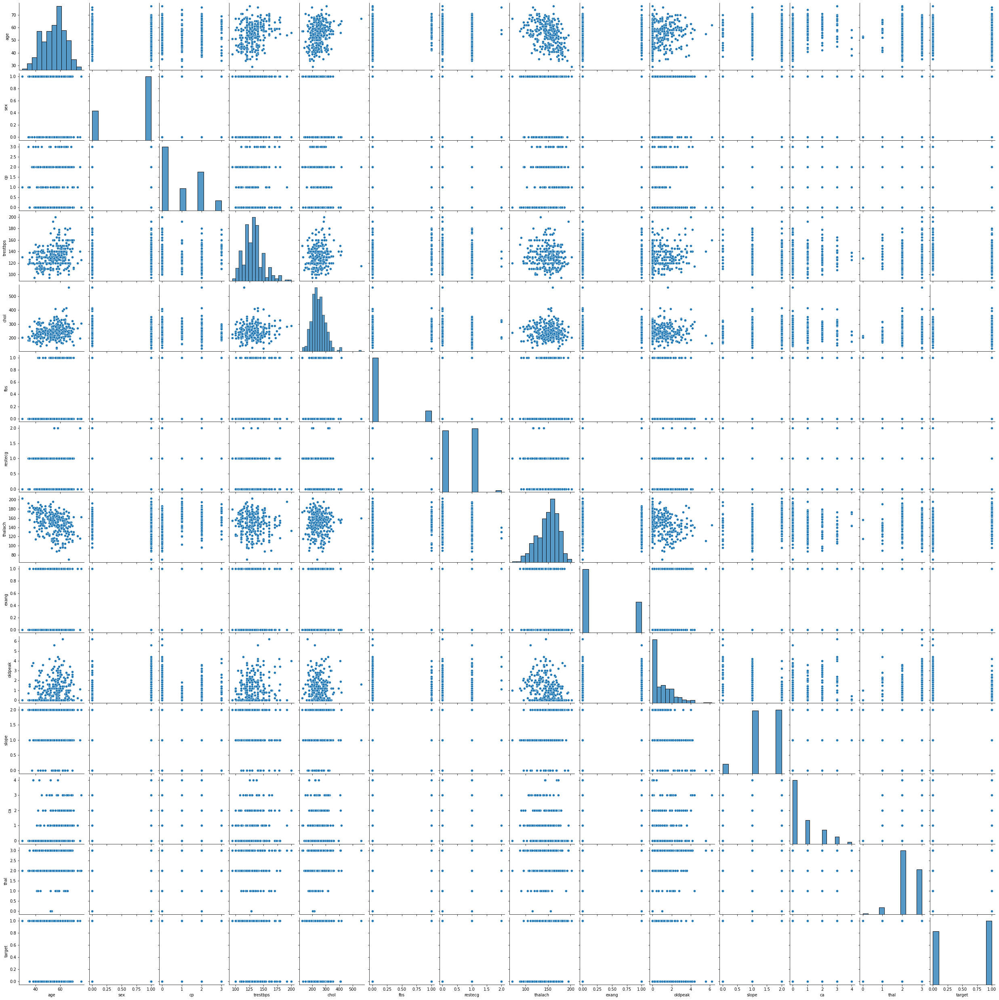

In [7]:
sns.pairplot(data)

<AxesSubplot:>

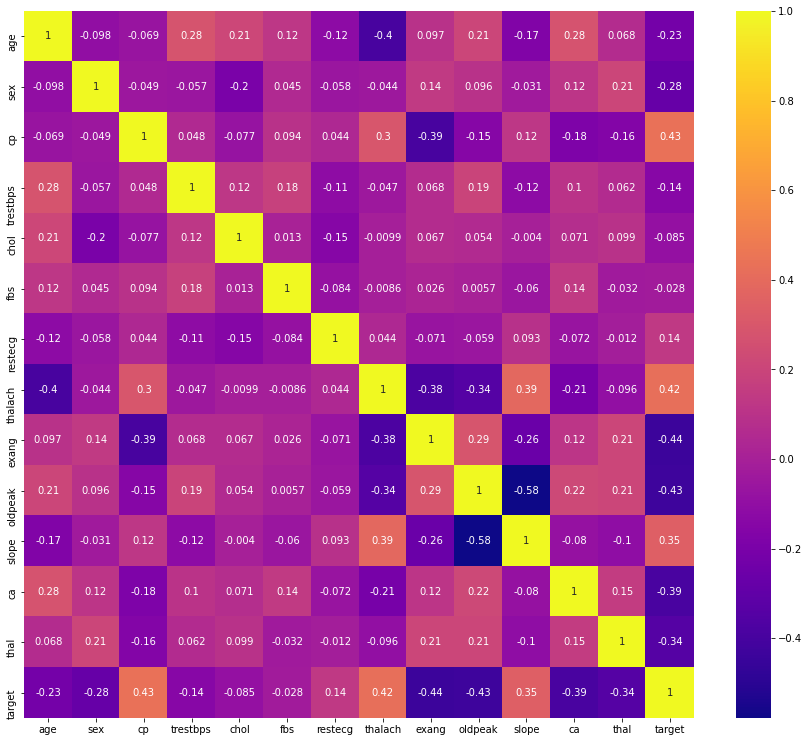

In [8]:
plt.figure(figsize=(15, 13))
sns.heatmap(correlation, annot=True, cmap=plt.cm.plasma)

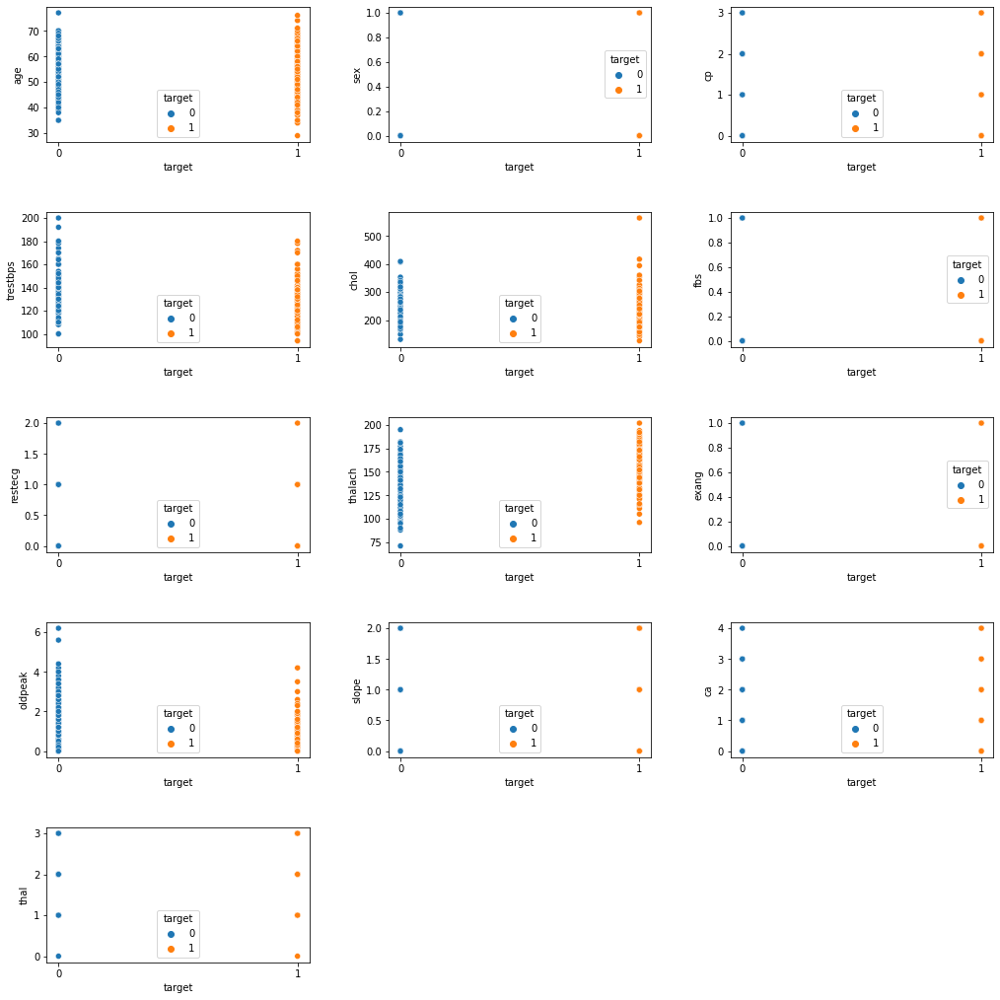

In [9]:
plt.figure(figsize=(15, 15))
for i in range(len(data.columns)-1):
    plt.subplot(5, 3, i+1)
    sns.scatterplot(data['target'],data[data.columns[i]],hue=data['target'])
    plt.xticks([0,1])
plt.tight_layout(pad=4.0)

In [10]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()

In [11]:
X = data.drop('target', axis = 1)
y = data['target']
data = sc.fit(X).transform(X)

In [12]:
from sklearn.model_selection import train_test_split

In [13]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.25,random_state=3)

In [14]:
from models import Models
classifiers = Models(X_train, y_train, X_test, y_test)

[MLENS] backend: threading


In [15]:
classifiers.SVM_Classifier()

SVM accuracy is :0.7763157894736842


In [16]:
classifiers.RF_Classifier(250)

random forest accuracy is :0.8421052631578947


In [17]:
classifiers.ExtraTress_Classifier(300)

ExtraTreesClassifier accuracy is :0.8552631578947368


In [18]:
classifiers.Bagging_Classifier(300)

BaggingClassifier accuracy is :0.8289473684210527


In [19]:
classifiers.AdaBoost_Classifier()

AdaBoostClassifier accuracy is :0.8026315789473685


In [20]:
classifiers.LR_Classifier()

LogisticRegression accuracy is :0.868421052631579


In [21]:
from sklearn.ensemble import RandomForestClassifier
pred = classifiers.mlen_combined_model(RandomForestClassifier(n_estimators=300))

                                      score-m  score-s  ft-m  ft-s  pt-m  pt-s
layer-1  adaboostclassifier      0       0.79     0.00  0.22  0.00  0.01  0.00
layer-1  baggingclassifier       0       0.75     0.00  2.22  0.00  0.16  0.00
layer-1  decisiontreeclassifier  0       0.70     0.00  0.00  0.00  0.00  0.00
layer-1  extratreesclassifier    0       0.82     0.00  1.32  0.00  0.10  0.00
layer-1  gaussiannb              0       0.83     0.00  0.00  0.00  0.00  0.00
layer-1  kneighborsclassifier    0       0.63     0.00  0.00  0.00  0.04  0.00
layer-1  logisticregression      0       0.83     0.00  0.00  0.00  0.00  0.00
layer-1  randomforestclassifier  0       0.75     0.00  1.29  0.00  0.06  0.00
layer-1  svc                     0       0.62     0.00  0.01  0.00  0.00  0.00
layer-1  xgbclassifier           0       0.77     0.00  0.21  0.00  0.00  0.00
layer-2  adaboostclassifier      0       0.81     0.02  0.25  0.02  0.01  0.00
layer-2  baggingclassifier       0       0.79     0.

In [22]:
classifiers.final_report(pred)

              precision    recall  f1-score   support

           0       0.96      0.76      0.85        29
           1       0.87      0.98      0.92        47

    accuracy                           0.89        76
   macro avg       0.91      0.87      0.88        76
weighted avg       0.90      0.89      0.89        76

